# Pix2Pix GAN - Gaussian Noise Removal

## 🆕 Residual Learning Mode

Questo notebook supporta **Residual Learning** per migliorare il denoising:

### Come Funziona

**Standard Mode (residual_learning=False):**
- Generatore predice direttamente l'immagine pulita: `clean_hat = G(noisy)`
- Output con `tanh()` in [-1, 1]

**Residual Learning Mode (residual_learning=True):**
- Generatore predice il **rumore**: `noise_hat = G(noisy)`
- Immagine pulita ricostruita: `clean_hat = clamp(noisy - noise_hat, -1, 1)`
- Output **senza tanh()** (rumore non è limitato)

### Vantaggi del Residual Learning

1. ✅ **Task più facile**: Predire rumore è più semplice che predire immagine
2. ✅ **Convergenza più rapida**: Il generatore si concentra sul residuo
3. ✅ **Preserva dettagli**: L'immagine originale viene mantenuta nella sottrazione
4. ✅ **Meglio per denoising forte** (σ = 100)

## 🎯 Early Stopping & Scheduler Ottimizzati

### Early Stopping
- **Monitor:** `val_ssim` (massimizza qualità percettiva)
- **Patience:** 25 epoche
- **Min delta:** 1e-4 (soglia per miglioramenti significativi)
- **Logica:** Training si ferma se SSIM non migliora di almeno 0.0001 per 25 epoche

### Learning Rate Scheduler (solo Discriminatore)
- **Monitor:** `val_ssim` con **moving average** (window=3)
- **Mode:** max (massimizza SSIM)
- **Patience:** 12 epoche
- **Factor:** 0.5 (dimezza LR)
- **Min LR:** 1e-6
- **Cooldown:** 5 epoche (previene drop ravvicinati)

**Perché moving average?**
- Riduce rumore nelle metriche epoch-to-epoch
- Scheduler più stabile, meno oscillazioni
- Evita LR drop per fluttuazioni temporanee

### Configurazione

Modifica nella cella "Training Configuration":
```python
"residual_learning": True,   # ✅ Attiva residual learning
"use_tanh": False,          # ✅ Rimuovi tanh() per rumore
"patience": 25,             # ✅ Early stopping su SSIM
```

## 1. Configuration & Control Variables

In [3]:
# Control variable: Set to True to skip training and only load/visualize existing results
# Useful for viewing history, plotting curves, or running inference without training
SKIP_TRAINING = False  # Set to True to skip the training loop

# Telegram notifications configuration
telegram_config = {
    "notify_every": 0,  # Send notification every N epochs (0 to disable)
    "model_name": "Pix2Pix GAN",
    "degradation_info": {
        "type": "Gaussian Noise",
        "description": "Additive white Gaussian noise",
        "settings": {
            "Sigma": 25,
            "Mean": 0.0,
            "Std deviation": 0.1,
            "Distribution": "Normal (Gaussian)",
        },
    },
}

## 2. Imports

In [4]:
import sys
from pathlib import Path


import warnings
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.cuda.amp import GradScaler
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import json

from src.degradations.generate_degraded_dataset import generate_degraded_dataset
from src.models.pix2pix import Pix2PixGenerator, PatchGANDiscriminator
from src.losses.combined_loss import CombinedLoss
from src.training import get_dataloaders
from src.training.training_pix2pix import train_epoch_pix2pix, validate_pix2pix
from src.utils import (
    get_degraded_data_dir,
    get_raw_data_dir,
    plot_image_comparison,
    plot_inference_results,
    download_div2k_dataset,
    get_model_experiments_dir,
    setup_or_resume_experiment,
    resume_training,
)
from src.evaluation import ImageRestorationEvaluator

warnings.filterwarnings("ignore")

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

PyTorch version: 2.9.1+cu130
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3070
CUDA memory: 8.59 GB


## 3. Training Configuration

In [5]:
config = {
    # Data paths
    "train_degraded_dir": str(get_degraded_data_dir() / "gaussian" / "DIV2K_train_HR"),
    "train_clean_dir": str(get_raw_data_dir() / "DIV2K_train_HR"),
    "val_degraded_dir": str(get_degraded_data_dir() / "gaussian" / "DIV2K_valid_HR"),
    "val_clean_dir": str(get_raw_data_dir() / "DIV2K_valid_HR"),
    
    # 🔥 TRAINING PARAMETERS
    "batch_size": 8,              
    "num_epochs": 150,  # ⬇️ Ridotto: con residual learning converge prima

    # 🧠 LEARNING RATES (GAN debole)
    "learning_rate_G": 2e-4,  # ⬆️ Aumentato per convergenza più rapida
    "learning_rate_D": 1e-5,  # ⬇️ Ridotto: ratio 

    "beta1": 0.5,
    "beta2": 0.999,
    
    # 🎯 LOSS BALANCE (L1+SSIM, GAN debole)
    "lambda_L1": 150.0,  # ⬇️ Ridotto da 200 per preservare dettagli
    
    # ⚡ DATA
    "patch_size": 384,
    "patches_per_image": 8,
    "num_workers": 4,
    
    # 💪 NETWORK CAPACITY
    "generator_features": 128,       # ⬇️ Ridotto: più efficiente per residual
    "discriminator_features": 32,   # ⬇️ Ridotto: discriminatore debole
    
    # Degradation
    "noise_sigma": 100.0,
    
    # 🆕 TRAINING STABILITY
    "gradient_clip": 1.0,
    "noise_clamp_value": 0.6,    # 🔧 Ridotto da 3.0 a 0.6 per preservare texture/contorni
    
    # 🆕 RESIDUAL LEARNING (KEY!)
    "residual_learning": True,   # ✅ Predici rumore
    "use_tanh": False,          # ✅ No tanh per rumore
    
    # Training stability
    "patience": 25,  # ⬆️ Più pazienza
    "save_every": 10,
    "val_every": 1,
    
    # Mixed precision
    "use_amp": True,  # 🔄 Monitorare per stability con residual learning
    
    # Resume training
    "resume_from_checkpoint": False,  # ⬇️ Fresh start
    "resume_experiment": "latest",
    
    # Device
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "seed": 42,
}

# Set seed for reproducibility
torch.manual_seed(config["seed"])
np.random.seed(config["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed(config["seed"])
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

print("\n📋 Pix2Pix Configuration:")
for key, value in config.items():
    print(f"   {key}: {value}")


📋 Pix2Pix Configuration:
   train_degraded_dir: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\data\degraded\gaussian\DIV2K_train_HR
   train_clean_dir: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\data\raw\DIV2K_train_HR
   val_degraded_dir: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\data\degraded\gaussian\DIV2K_valid_HR
   val_clean_dir: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\data\raw\DIV2K_valid_HR
   batch_size: 8
   num_epochs: 150
   learning_rate_G: 0.0002
   learning_rate_D: 1e-05
   beta1: 0.5
   beta2: 0.999
   lambda_L1: 150.0
   patch_size: 384
   patches_per_image: 8
   num_workers: 4
   generator_features: 128
   discriminator_features: 32
   noise_sigma: 100.0
   gradient_clip: 1.0
   noise_clamp_value: 0.6
   residual_learning: True
   use_tanh: False
   patience: 25
   save_every: 10
   val_every: 1
   use_amp: True
   resume_from_checkpoint: False
   resume_experiment: latest
   device: cuda
   seed: 42


## 4. Setup Experiment Directories

In [6]:
# Setup or resume experiment
exp_dir, checkpoints_dir, samples_dir, logs_dir = setup_or_resume_experiment(
    model_name="pix2pix",
    degradation="gaussian",
    config=config,
    resume_from_checkpoint=config["resume_experiment"] if config["resume_from_checkpoint"] else None,
)

print(f"\n📁 Experiment directory: {exp_dir}")
print(f"   Checkpoints: {checkpoints_dir}")
print(f"   Samples: {samples_dir}")
print(f"   Logs: {logs_dir}")


📁 Experiment: 20260111_173805

📁 Experiment directory: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260111_173805
   Checkpoints: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260111_173805\checkpoints
   Samples: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260111_173805\samples
   Logs: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260111_173805\logs


## 5. Setup TensorBoard

In [7]:
# TensorBoard writer
writer = SummaryWriter(log_dir=logs_dir)

print(f"\n📊 TensorBoard logs: {logs_dir}")
print(f"   Run: tensorboard --logdir {logs_dir.absolute()}")


📊 TensorBoard logs: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260111_173805\logs
   Run: tensorboard --logdir c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260111_173805\logs


## 6. Generate Degraded Datasets

Generate corrupted versions of DIV2K images using Gaussian noise with sigma=25

## ⚠️ CRITICAL FIX: Regenerate Dataset

**PROBLEMA INDIVIDUATO:** Il dataset precedente usava lo stesso seed per tutte le immagini, generando **identico pattern di rumore** su ogni immagine! La rete ha memorizzato quel pattern specifico invece di imparare denoising generalizzato.

**SOLUZIONE:** Il codice è stato fixato per generare rumore **unico per ogni immagine** (seed + image_index).

**AZIONE RICHIESTA:** Elimina i vecchi dataset e rigenera con il fix:
```python
# Elimina i vecchi dataset corrotti
import shutil
shutil.rmtree(config["train_degraded_dir"], ignore_errors=True)
shutil.rmtree(config["val_degraded_dir"], ignore_errors=True)
```

In [8]:
# Check if raw datasets exist, if not download them
train_clean_exists = Path(config["train_clean_dir"]).exists()
val_clean_exists = Path(config["val_clean_dir"]).exists()

if not train_clean_exists or not val_clean_exists:
    print("=" * 80)
    print("📥 DIV2K Dataset Not Found - Downloading...")
    print("=" * 80)
    download_div2k_dataset()
else:
    print("✅ DIV2K raw dataset already exists")

# Check if degraded datasets already exist
train_degraded_exists = Path(config["train_degraded_dir"]).exists()
val_degraded_exists = Path(config["val_degraded_dir"]).exists()

if train_degraded_exists and val_degraded_exists:
    n_train = len(list(Path(config["train_degraded_dir"]).glob("*.png")))
    n_val = len(list(Path(config["val_degraded_dir"]).glob("*.png")))
    print("✅ Degraded datasets already exist:")
    print(f"   Train: {n_train} images in {config['train_degraded_dir']}")
    print(f"   Val: {n_val} images in {config['val_degraded_dir']}")
    print("\n⏭️  Skipping generation (delete folders to regenerate)")
else:
    print("=" * 80)
    print("🎨 Generating Degraded Datasets")
    print("=" * 80)
    print(f"\nDegradation: Gaussian noise (sigma={config['noise_sigma']})")
    print("This will create corrupted versions of DIV2K images\n")

    # Generate training dataset
    if not train_degraded_exists:
        print("📂 Training Dataset")
        generate_degraded_dataset(
            input_dir=config["train_clean_dir"],
            output_dir=config["train_degraded_dir"],
            degradation_type="gaussian_noise",
            noise_sigma=config["noise_sigma"],
            seed=config["seed"],
        )

    # Generate validation dataset
    if not val_degraded_exists:
        print("📂 Validation Dataset")
        generate_degraded_dataset(
            input_dir=config["val_clean_dir"],
            output_dir=config["val_degraded_dir"],
            degradation_type="gaussian_noise",
            noise_sigma=config["noise_sigma"],
            seed=config["seed"],
        )

    print("=" * 80)
    print("✅ Degraded datasets generated successfully!")
    print("=" * 80)

✅ DIV2K raw dataset already exists
✅ Degraded datasets already exist:
   Train: 800 images in c:\Development\Deep_Learning\Progetto1\Image-Enhancement\data\degraded\gaussian\DIV2K_train_HR
   Val: 100 images in c:\Development\Deep_Learning\Progetto1\Image-Enhancement\data\degraded\gaussian\DIV2K_valid_HR

⏭️  Skipping generation (delete folders to regenerate)


## 7. Create Dataloaders

In [9]:
# Create dataloaders
train_loader, val_loader = get_dataloaders(
    train_degraded_dir=config["train_degraded_dir"],
    train_clean_dir=config["train_clean_dir"],
    val_degraded_dir=config["val_degraded_dir"],
    val_clean_dir=config["val_clean_dir"],
    batch_size=config["batch_size"],
    patch_size=config["patch_size"],
    patches_per_image=config["patches_per_image"],
    num_workers=config["num_workers"],
)

print(f"\n📦 Dataloaders created:")
print(f"   Batches per epoch: {len(train_loader)} train, {len(val_loader)} val")
print(f"   Total training samples: {len(train_loader.dataset)}")
print(f"   Total validation samples: {len(val_loader.dataset)}")

KeyboardInterrupt: 

## 8. Visualize Sample Batch

📸 Batch shapes:
   Degraded: torch.Size([8, 3, 384, 384])
   Clean: torch.Size([8, 3, 384, 384])
   Range: [-1.000, 1.000]


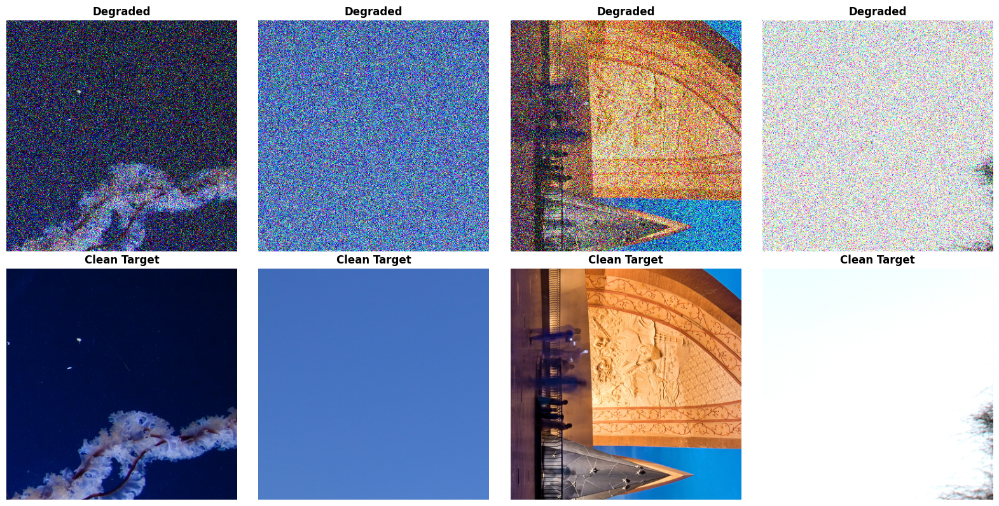


✅ Sample batch saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\samples\training_samples.png


In [ ]:
# Visualize a batch
degraded_batch, clean_batch = next(iter(train_loader))

print("📸 Batch shapes:")
print(f"   Degraded: {degraded_batch.shape}")
print(f"   Clean: {clean_batch.shape}")
print(f"   Range: [{degraded_batch.min():.3f}, {degraded_batch.max():.3f}]")

# Show sample using utility function
plot_image_comparison(
    degraded_batch=degraded_batch,
    clean_batch=clean_batch,
    n_samples=4,
    save_path=samples_dir / "training_samples.png",
)

print(f"\n✅ Sample batch saved to {samples_dir / 'training_samples.png'}")

## 9. Initialize Models

**Generator:** UNet-based with skip connections (encoder-decoder)
**Discriminator:** PatchGAN with 70×70 receptive field

In [ ]:
# Create Generator (UNet-based)
generator = Pix2PixGenerator(
    in_channels=3,
    out_channels=3,
    features=config["generator_features"],
    use_tanh=config["use_tanh"]  # 🆕 Rimuovi tanh per residual learning
).to(config["device"])

print("\n🎨 Generator: Pix2Pix UNet")
print(f"   Architecture: Encoder-Decoder with skip connections")
if config["residual_learning"]:
    print(f"   🆕 Mode: Residual Learning (predicts noise)")
    print(f"   Output activation: None (unbounded for noise prediction)")
else:
    print(f"   Mode: Direct Prediction (predicts clean image)")
    print(f"   Output activation: Tanh (bounded to [-1, 1])")
print(f"   Features: {config['generator_features']}")
print(f"   Parameters: {generator.get_num_params():,}")
print(f"   Device: {config['device']}")

# Create Discriminator (PatchGAN)
discriminator = PatchGANDiscriminator(
    in_channels=6,  # 3 (condition) + 3 (target)
    features=config["discriminator_features"]
).to(config["device"])

print("\n🔍 Discriminator: PatchGAN")
print(f"   Receptive field: 70×70 patches")
print(f"   Input: Concatenation [condition | target]")
print(f"   Features: {config['discriminator_features']}")
print(f"   Parameters: {discriminator.get_num_params():,}")
print(f"   Device: {config['device']}")

print(f"\n📊 Total parameters: {generator.get_num_params() + discriminator.get_num_params():,}")


🎨 Generator: Pix2Pix UNet
   Architecture: Encoder-Decoder with skip connections
   🆕 Mode: Residual Learning (predicts noise)
   Output activation: None (unbounded for noise prediction)
   Features: 128
   Parameters: 167,281,923
   Device: cuda

🔍 Discriminator: PatchGAN
   Receptive field: 70×70 patches
   Input: Concatenation [condition | target]
   Features: 32
   Parameters: 696,193
   Device: cuda

📊 Total parameters: 167,978,116


## 10. Initialize Loss Functions and Optimizers

In [ ]:
# Loss functions
criterion_GAN = nn.BCEWithLogitsLoss().to(config["device"])
criterion_L1 = CombinedLoss(alpha=0.84, beta=0.16).to(config["device"])  # L1 (84%) + SSIM (16%)

print("\n📉 Loss Functions:")
print(f"   Adversarial: BCEWithLogitsLoss")
print(f"   Reconstruction: CombinedLoss (L1: 84% + SSIM: 16%)")
print(f"   Lambda L1: {config['lambda_L1']}")

# Optimizers (separate for G and D)
optimizer_G = optim.Adam(
    generator.parameters(),
    lr=config["learning_rate_G"],
    betas=(config["beta1"], config["beta2"])
)

optimizer_D = optim.Adam(
    discriminator.parameters(),
    lr=config["learning_rate_D"],
    betas=(config["beta1"], config["beta2"])
)

print("\n⚙️  Optimizers:")
print(f"   Generator: Adam(lr={config['learning_rate_G']}, β₁={config['beta1']}, β₂={config['beta2']})")
print(f"   Discriminator: Adam(lr={config['learning_rate_D']}, β₁={config['beta1']}, β₂={config['beta2']})")

# 🆕 Learning rate schedulers
scheduler_G = None  # Generator LR remains fixed

# ReduceLROnPlateau for Discriminator only (con cooldown)
scheduler_D = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_D,
    mode='max',          # ✅ Massimizza SSIM
    factor=0.5,          # Dimezza LR
    patience=5,          # 🎯 5 epoche senza miglioramento
    min_lr=1e-6,         # LR minimo
    cooldown=0,          # 5 epoche dopo LR drop
    threshold=0.01,      # 🎯 Miglioramento minimo: 0.01 in SSIM
    threshold_mode='abs' # 🎯 Threshold assoluto (non relativo)
)

print("\n📅 Schedulers:")
print("   Generator: None (fixed LR)")
print("   Discriminator: ReduceLROnPlateau")
print("     - Mode: max (monitors val_ssim)")
print("     - Factor: 0.5 (halves LR on plateau)")
print("     - Patience: 5 epochs")
print("     - Threshold: 0.01 (absolute - requires +0.01 SSIM improvement)")
print("     - Min LR: 1e-6")
print("     - Cooldown: 5 epochs")
print("     - Starts after: epoch 10")

# Gradient scalers for mixed precision
scaler_G = GradScaler() if config["use_amp"] else None
scaler_D = GradScaler() if config["use_amp"] else None

if config["use_amp"]:
    print("\n⚡ Mixed Precision: Enabled (AMP)")



📉 Loss Functions:
   Adversarial: BCEWithLogitsLoss
   Reconstruction: CombinedLoss (L1: 84% + SSIM: 16%)
   Lambda L1: 150.0

⚙️  Optimizers:
   Generator: Adam(lr=0.0002, β₁=0.5, β₂=0.999)
   Discriminator: Adam(lr=1e-05, β₁=0.5, β₂=0.999)

📅 Schedulers:
   Generator: None (fixed LR)
   Discriminator: ReduceLROnPlateau
     - Mode: max (monitors val_ssim)
     - Factor: 0.5 (halves LR on plateau)
     - Patience: 5 epochs
     - Threshold: 0.01 (absolute - requires +0.01 SSIM improvement)
     - Min LR: 1e-6
     - Cooldown: 5 epochs
     - Starts after: epoch 10

⚡ Mixed Precision: Enabled (AMP)


## 10b. Resume Training (if enabled)

In [ ]:
# Initialize training state
start_epoch = 0
initial_best_loss_G = float("inf")
initial_best_epoch = 0
initial_history = None

if config["resume_from_checkpoint"]:
    # For Pix2Pix, we need to manually load both generator and discriminator
    # (load_checkpoint() is designed for single-model checkpoints)
    checkpoint_path = checkpoints_dir / "checkpoint_epoch_010.pth"
    
    if not checkpoint_path.exists():
        raise FileNotFoundError(f"Checkpoint not found: {checkpoint_path}")
    
    print(f"\n🔄 Resuming from checkpoint: {checkpoint_path}")
    
    # Load checkpoint
    checkpoint = torch.load(checkpoint_path, map_location=config["device"], weights_only=False)
    
    # Load generator
    generator.load_state_dict(checkpoint["generator_state_dict"])
    optimizer_G.load_state_dict(checkpoint["optimizer_G_state_dict"])
    print("   ✓ Generator state loaded")
    
    # Load discriminator
    if "discriminator_state_dict" in checkpoint:
        discriminator.load_state_dict(checkpoint["discriminator_state_dict"])
        optimizer_D.load_state_dict(checkpoint["optimizer_D_state_dict"])
        print("   ✓ Discriminator state loaded")
    
    # Load schedulers if present
    if scheduler_G is not None and "scheduler_G_state_dict" in checkpoint and checkpoint["scheduler_G_state_dict"] is not None:
        scheduler_G.load_state_dict(checkpoint["scheduler_G_state_dict"])
        scheduler_D.load_state_dict(checkpoint["scheduler_D_state_dict"])
        print("   ✓ Schedulers loaded")
    
    # Load scalers if using AMP
    if config["use_amp"] and "scaler_G_state_dict" in checkpoint and checkpoint["scaler_G_state_dict"] is not None:
        scaler_G.load_state_dict(checkpoint["scaler_G_state_dict"])
        scaler_D.load_state_dict(checkpoint["scaler_D_state_dict"])
        print("   ✓ Gradient scalers loaded")
    
    # Extract training state
    start_epoch = checkpoint["epoch"]
    initial_best_epoch = checkpoint["epoch"]
    
    # Handle both old and new checkpoint formats
    if "metrics" in checkpoint:
        # New format: nested metrics structure
        initial_best_loss_G = checkpoint["metrics"].get("val", {}).get("loss_G", float("inf"))
    elif "val_loss_G" in checkpoint:
        # Old format: flat structure
        initial_best_loss_G = checkpoint["val_loss_G"]
    else:
        initial_best_loss_G = float("inf")
    
    # Load history
    history_path = exp_dir / "history.json"
    if history_path.exists():
        with open(history_path, "r") as f:
            initial_history = json.load(f)
        print(f"   ✓ History loaded: {len(initial_history['train_loss_G'])} epochs")
    
    print(f"\n✅ Resume successful:")
    print(f"   Experiment: {exp_dir.name}")
    print(f"   Starting epoch: {start_epoch + 1}")
    print(f"   Best val loss G: {initial_best_loss_G:.6f}")
    print(f"   Best epoch: {initial_best_epoch}")
else:
    print("\n🆕 Starting fresh training (resume_from_checkpoint=False)")


🆕 Starting fresh training (resume_from_checkpoint=False)


## 11. Training Loop

Alternating training:
1. **Train Discriminator:** Distinguish real pairs (x, y) from fake pairs (x, G(x))
2. **Train Generator:** Fool discriminator + minimize L1 loss

In [ ]:
if not SKIP_TRAINING:
    # Training history (use initial_history if resuming)
    if initial_history is not None:
        history = initial_history
        print(f"\n📋 Continuing from existing history ({len(history['train_loss_G'])} epochs)")
    else:
        history = {
            'train_loss_G': [],
            'train_loss_G_GAN': [],
            'train_loss_G_L1': [],
            'train_loss_D': [],
            'train_loss_D_real': [],
            'train_loss_D_fake': [],
            'val_loss_G': [],
            'val_loss_G_GAN': [],
            'val_loss_G_L1': [],
            'val_loss_D': [],
            'val_ssim': [],
            'val_ssim_ma': [],  # 🆕 Moving average
            'lr_G': [],
            'lr_D': [],
            # 🆕 Monitoraggio noise_hat per residual learning
            'train_noise_mean': [],
            'train_noise_std': [],
            'train_noise_max': [],
            'train_noise_abs_mean': [],  # 🆕 Mean of absolute values
            'val_noise_mean': [],
            'val_noise_std': [],
            'val_noise_max': [],
            'val_noise_abs_mean': [],  # 🆕 Mean of absolute values
        }
    
    # 🆕 Early stopping basato su val_ssim (max)
    best_val_ssim = 0.0  # Inizializza a 0 (vogliamo massimizzare)
    if initial_history and len(initial_history.get('val_ssim', [])) > 0:
        best_val_ssim = max([x for x in initial_history['val_ssim'] if x > 0], default=0.0)
    
    best_val_loss_G = initial_best_loss_G  # Mantieni per compatibilità checkpoints
    best_epoch = initial_best_epoch
    patience_counter = 0
    min_delta = 1e-4  # 🆕 Soglia minima per considerare miglioramenti
    
    # 🆕 Moving average per SSIM (window size = 3)
    ssim_window = []
    ssim_ma_window_size = 3
    
    # Telegram: Send training start notification
    if telegram_config["notify_every"] > 0:
        from src.utils.telegram_notifier import send_telegram_message, format_training_start_message
        msg = format_training_start_message(
            model_name=telegram_config["model_name"],
            config=config,
            experiment_name=exp_dir.name,
            total_params=generator.get_num_params() + discriminator.get_num_params(),
            resume_from_epoch=start_epoch,
            degradation_info=telegram_config["degradation_info"],
        )
        send_telegram_message(msg)
    
    print("\n" + "=" * 80)
    print("🚀 STARTING PIX2PIX GAN TRAINING")
    if config["residual_learning"]:
        print("   🆕 Mode: RESIDUAL LEARNING (Generator predicts noise)")
    else:
        print("   Mode: Direct Prediction (Generator predicts clean image)")
    print("=" * 80)
    print(f"   Total epochs: {config['num_epochs']}")
    print(f"   Starting epoch: {start_epoch + 1}")
    print(f"   Batch size: {config['batch_size']}")
    print(f"   Early Stopping: val_ssim (max) | patience={config['patience']} | min_delta={min_delta}")
    print(f"   Scheduler D: val_ssim_ma (max) | patience=12 | cooldown=5")
    if best_val_ssim > 0:
        print(f"   Resuming from best val SSIM: {best_val_ssim:.4f}")
    print("=" * 80 + "\n")
    
    # Training loop
    for epoch in range(start_epoch + 1, config['num_epochs'] + 1):
        print(f"\n{'='*80}")
        print(f"Epoch {epoch}/{config['num_epochs']}")
        
        # 🆕 Show current learning rates BEFORE training
        current_lr_G = optimizer_G.param_groups[0]['lr']
        current_lr_D = optimizer_D.param_groups[0]['lr']
        
        print(f"   Current LR → Generator: {current_lr_G:.2e} | Discriminator: {current_lr_D:.2e} (ratio: {current_lr_G/current_lr_D:.2f})")
        print(f"{'='*80}")
        
        # Train
        train_metrics = train_epoch_pix2pix(
            generator=generator,
            discriminator=discriminator,
            train_loader=train_loader,
            criterion_GAN=criterion_GAN,
            criterion_L1=criterion_L1,
            optimizer_G=optimizer_G,
            optimizer_D=optimizer_D,
            device=config['device'],
            epoch=epoch,
            lambda_L1=config['lambda_L1'],
            gradient_clip=config['gradient_clip'],
            use_amp=config['use_amp'],
            scaler_G=scaler_G,
            scaler_D=scaler_D,
            residual_learning=config['residual_learning'],  # 🆕 Passa il parametro
        )
        
        # Validate
        if epoch % config['val_every'] == 0:
            val_metrics = validate_pix2pix(
                generator=generator,
                discriminator=discriminator,
                val_loader=val_loader,
                criterion_GAN=criterion_GAN,
                criterion_L1=criterion_L1,
                device=config['device'],
                epoch=epoch,
                lambda_L1=config['lambda_L1'],
                residual_learning=config['residual_learning'],  # 🆕 Passa il parametro
                calculate_ssim=True,  # 🆕 SSIM calcolato direttamente in validate_pix2pix
                ssim_max_batches=8,   # 🆕 SSIM su primi 8 batch (veloce e stabile)
            )
            
            # 🆕 Calculate moving average for SSIM
            ssim_window.append(val_metrics['ssim'])
            if len(ssim_window) > ssim_ma_window_size:
                ssim_window.pop(0)  # Mantieni solo ultimi N valori
            val_ssim_ma = sum(ssim_window) / len(ssim_window)
        else:
            val_metrics = {k: 0.0 for k in ['loss_G', 'loss_G_GAN', 'loss_G_L1', 'loss_D', 'ssim', 'noise_mean', 'noise_std', 'noise_max']}
            val_ssim_ma = 0.0
        
        # 🆕 Learning rate scheduling (solo Discriminatore, dopo epoch 5)
        if epoch >= 5 and scheduler_D is not None and epoch % config['val_every'] == 0 and val_metrics.get('ssim', 0) > 0:
            old_lr_D = optimizer_D.param_groups[0]['lr']
            
            # ✅ Step basato su SSIM diretto (non moving average) con threshold=0.01
            current_ssim = val_metrics.get('ssim', 0)
            scheduler_D.step(current_ssim)
            
            new_lr_D = optimizer_D.param_groups[0]['lr']
            
            # Stampa solo se è cambiato
            if new_lr_D != old_lr_D:
                print(f"   📉 Discriminator LR reduced: {old_lr_D:.2e} → {new_lr_D:.2e}")
                print(f"      Reason: val_ssim={current_ssim:.4f} no improvement ≥0.01 for 5 epochs")
            
            # Warning if discriminator becomes too weak
            if new_lr_D <= 2e-6:
                print(f"   ⚠️  WARNING: LR_D very low ({new_lr_D:.2e}) - Discriminator may become too weak!")
        
        # Store metrics
        history['train_loss_G'].append(float(train_metrics['loss_G']))
        history['train_loss_G_GAN'].append(float(train_metrics['loss_G_GAN']))
        history['train_loss_G_L1'].append(float(train_metrics['loss_G_L1']))
        history['train_loss_D'].append(float(train_metrics['loss_D']))
        history['train_loss_D_real'].append(float(train_metrics['loss_D_real']))
        history['train_loss_D_fake'].append(float(train_metrics['loss_D_fake']))
        history['val_loss_G'].append(float(val_metrics['loss_G']))
        history['val_loss_G_GAN'].append(float(val_metrics['loss_G_GAN']))
        history['val_loss_G_L1'].append(float(val_metrics['loss_G_L1']))
        history['val_loss_D'].append(float(val_metrics['loss_D']))
        history['val_ssim'].append(float(val_metrics.get('ssim', 0.0)))
        history['val_ssim_ma'].append(float(val_ssim_ma))  # 🆕 Salva moving average
        history['lr_G'].append(float(optimizer_G.param_groups[0]['lr']))
        history['lr_D'].append(float(optimizer_D.param_groups[0]['lr']))
        # 🆕 Salva statistiche noise_hat
        history['train_noise_mean'].append(float(train_metrics.get('noise_mean', 0.0)))
        history['train_noise_std'].append(float(train_metrics.get('noise_std', 0.0)))
        history['train_noise_max'].append(float(train_metrics.get('noise_max', 0.0)))
        history['train_noise_abs_mean'].append(float(train_metrics.get('noise_abs_mean', 0.0)))
        history['val_noise_mean'].append(float(val_metrics.get('noise_mean', 0.0)))
        history['val_noise_std'].append(float(val_metrics.get('noise_std', 0.0)))
        history['val_noise_max'].append(float(val_metrics.get('noise_max', 0.0)))
        history['val_noise_abs_mean'].append(float(val_metrics.get('noise_abs_mean', 0.0)))
        
        # Print epoch summary
        print(f"\n📊 Epoch {epoch} Summary:")
        print(f"   Train - G: {train_metrics['loss_G']:.4f} (GAN: {train_metrics['loss_G_GAN']:.4f}, L1: {train_metrics['loss_G_L1']:.4f})")
        print(f"   Train - D: {train_metrics['loss_D']:.4f} (Real: {train_metrics['loss_D_real']:.4f}, Fake: {train_metrics['loss_D_fake']:.4f})")
        if config['residual_learning']:
            print(f"   🔍 Noise - Train: μ={train_metrics.get('noise_mean', 0):.3f}, σ={train_metrics.get('noise_std', 0):.3f}, max={train_metrics.get('noise_max', 0):.3f}, mean(|·|)={train_metrics.get('noise_abs_mean', 0):.3f}")
        if epoch % config['val_every'] == 0:
            print(f"   Val   - G: {val_metrics['loss_G']:.4f} (GAN: {val_metrics['loss_G_GAN']:.4f}, L1: {val_metrics['loss_G_L1']:.4f})")
            print(f"   Val SSIM: {val_metrics.get('ssim', 0):.4f} | MA: {val_ssim_ma:.4f} (best: {best_val_ssim:.4f})")
            if config['residual_learning']:
                print(f"   🔍 Noise - Val:   μ={val_metrics.get('noise_mean', 0):.3f}, σ={val_metrics.get('noise_std', 0):.3f}, max={val_metrics.get('noise_max', 0):.3f}, mean(|·|)={val_metrics.get('noise_abs_mean', 0):.3f}")
        
        # 🆕 Show NEXT epoch's learning rates
        next_lr_G = optimizer_G.param_groups[0]['lr']
        next_lr_D = optimizer_D.param_groups[0]['lr']
        print(f"   Next LR → G: {next_lr_G:.2e}, D: {next_lr_D:.2e}")
        
        # 🆕 Show scheduler patience status (dopo epoch 10)
        if epoch >= 10 and scheduler_D is not None:
            scheduler_patience = scheduler_D.num_bad_epochs  # Epoche consecutive senza miglioramento
            scheduler_best = scheduler_D.best  # Miglior SSIM osservato dallo scheduler
            scheduler_cooldown = scheduler_D.cooldown_counter  # Cooldown attivo
            if scheduler_cooldown > 0:
                print(f"   📅 Scheduler: Cooldown active ({scheduler_cooldown}/{scheduler_D.cooldown} epochs)")
            else:
                print(f"   📅 Scheduler: Patience {scheduler_patience}/{scheduler_D.patience} | Best SSIM: {scheduler_best:.4f}")
        
        # Telegram: Send epoch update
        if telegram_config["notify_every"] > 0 and epoch % telegram_config["notify_every"] == 0:
            from src.utils.telegram_notifier import format_epoch_message
            msg = format_epoch_message(
                epoch=epoch,
                total_epochs=config["num_epochs"],
                train_loss=train_metrics['loss_G'],
                val_loss=val_metrics['loss_G'] if epoch % config['val_every'] == 0 else None,
                learning_rate=optimizer_G.param_groups[0]['lr'],
                additional_metrics={
                    "Train Loss D": train_metrics['loss_D'],
                    "Train Loss G L1": train_metrics['loss_G_L1'],
                    "Val Loss D": val_metrics['loss_D'] if epoch % config['val_every'] == 0 else None,
                    "Val SSIM": val_metrics.get('ssim', 0.0) if epoch % config['val_every'] == 0 else None,
                }
            )
            send_telegram_message(msg)
        
        # TensorBoard logging
        writer.add_scalar('Train/Loss_G', train_metrics['loss_G'], epoch)
        writer.add_scalar('Train/Loss_G_GAN', train_metrics['loss_G_GAN'], epoch)
        writer.add_scalar('Train/Loss_G_L1', train_metrics['loss_G_L1'], epoch)
        writer.add_scalar('Train/Loss_D', train_metrics['loss_D'], epoch)
        writer.add_scalar('Val/Loss_G', val_metrics['loss_G'], epoch)
        writer.add_scalar('Val/SSIM', val_metrics.get('ssim', 0.0), epoch)
        writer.add_scalar('Val/SSIM_MA', val_ssim_ma, epoch)  # 🆕 Log moving average
        writer.add_scalar('Learning_Rate/Generator', optimizer_G.param_groups[0]['lr'], epoch)
        writer.add_scalar('Learning_Rate/Discriminator', optimizer_D.param_groups[0]['lr'], epoch)
        # 🆕 Log noise_hat statistics
        if config['residual_learning']:
            writer.add_scalar('Noise/Train_Mean', train_metrics.get('noise_mean', 0.0), epoch)
            writer.add_scalar('Noise/Train_AbsMean', train_metrics.get('noise_abs_mean', 0.0), epoch)
            if epoch % config['val_every'] == 0:
                writer.add_scalar('Noise/Val_Mean', val_metrics.get('noise_mean', 0.0), epoch)
                writer.add_scalar('Noise/Val_Std', val_metrics.get('noise_std', 0.0), epoch)
                writer.add_scalar('Noise/Val_Max', val_metrics.get('noise_max', 0.0), epoch)
                writer.add_scalar('Noise/Val_AbsMean', val_metrics.get('noise_abs_mean', 0.0), epoch)
        
        # 🆕 Early stopping basato su val_ssim (MAX) con min_delta
        if epoch % config['val_every'] == 0 and val_metrics.get('ssim', 0.0) > 0:
            current_ssim = val_metrics['ssim']
            
            # Controlla se c'è miglioramento significativo (> min_delta)
            if current_ssim > best_val_ssim + min_delta:
                # Miglioramento significativo
                improvement = current_ssim - best_val_ssim
                best_val_ssim = current_ssim
                best_epoch = epoch
                best_val_loss_G = val_metrics['loss_G']  # Aggiorna anche loss_G per compatibilità
                patience_counter = 0
                
                # Salva best model
                checkpoint = {
                    'epoch': epoch,
                    'generator_state_dict': generator.state_dict(),
                    'discriminator_state_dict': discriminator.state_dict(),
                    'optimizer_G_state_dict': optimizer_G.state_dict(),
                    'optimizer_D_state_dict': optimizer_D.state_dict(),
                    'scheduler_G_state_dict': scheduler_G.state_dict() if scheduler_G else None,
                    'scheduler_D_state_dict': scheduler_D.state_dict() if scheduler_D else None,
                    'scaler_G_state_dict': scaler_G.state_dict() if config['use_amp'] else None,
                    'scaler_D_state_dict': scaler_D.state_dict() if config['use_amp'] else None,
                    'metrics': {
                        'train': {
                            'loss_G': train_metrics['loss_G'],
                            'loss_D': train_metrics['loss_D'],
                        },
                        'val': {
                            'loss_G': val_metrics['loss_G'],
                            'loss_D': val_metrics['loss_D'],
                            'ssim': current_ssim,
                            'ssim_ma': val_ssim_ma,
                        }
                    },
                    'config': config,
                }
                torch.save(checkpoint, checkpoints_dir / "best_model.pth")
                print(f"   💾 Best model saved! (Val SSIM: {best_val_ssim:.4f}, Δ+{improvement:.5f})")
            else:
                # Nessun miglioramento significativo
                patience_counter += 1
                print(f"   ⏳ No improvement (patience: {patience_counter}/{config['patience']})")
        
        # Save periodic checkpoint
        if epoch % config['save_every'] == 0:
            checkpoint = {
                'epoch': epoch,
                'generator_state_dict': generator.state_dict(),
                'discriminator_state_dict': discriminator.state_dict(),
                'optimizer_G_state_dict': optimizer_G.state_dict(),
                'optimizer_D_state_dict': optimizer_D.state_dict(),
                'scheduler_G_state_dict': scheduler_G.state_dict() if scheduler_G else None,
                'scheduler_D_state_dict': scheduler_D.state_dict() if scheduler_D else None,
                'scaler_G_state_dict': scaler_G.state_dict() if config['use_amp'] else None,
                'scaler_D_state_dict': scaler_D.state_dict() if config['use_amp'] else None,
                'metrics': {
                    'train': {
                        'loss_G': train_metrics['loss_G'],
                        'loss_D': train_metrics['loss_D'],
                    },
                    'val': {
                        'loss_G': val_metrics['loss_G'],
                        'loss_D': val_metrics['loss_D'],
                        'ssim': val_metrics.get('ssim', 0.0),
                        'ssim_ma': val_ssim_ma,
                    }
                },
                'config': config,
            }
            torch.save(checkpoint, checkpoints_dir / f"checkpoint_epoch_{epoch:03d}.pth")
            print(f"   💾 Checkpoint saved: epoch_{epoch:03d}.pth")
        
        # Save history
        with open(exp_dir / 'history.json', 'w') as f:
            json.dump(history, f, indent=4)
        
        # 🆕 Early stopping check (basato su val_ssim)
        if patience_counter >= config['patience']:
            print(f"\n⏹️  Early stopping triggered!")
            print(f"   No SSIM improvement (>{min_delta}) for {config['patience']} epochs.")
            print(f"   Best SSIM: {best_val_ssim:.4f} at epoch {best_epoch}")
            break
    
    # Telegram: Send training completion notification
    if telegram_config["notify_every"] > 0:
        from src.utils.telegram_notifier import format_training_complete_message
        msg = format_training_complete_message(
            model_name=telegram_config["model_name"],
            total_epochs=epoch,
            best_epoch=best_epoch,
            best_val_loss=best_val_ssim,  # Passa SSIM invece di loss
            final_train_loss=train_metrics['loss_G'],
        )
        send_telegram_message(msg)
    
    print("\n" + "=" * 80)
    print("✅ TRAINING COMPLETED")
    print("=" * 80)
    print(f"   Best epoch: {best_epoch}")
    print(f"   Best val SSIM: {best_val_ssim:.4f}")
    print(f"   Best val loss G: {best_val_loss_G:.4f}")
    print(f"   Total epochs: {epoch}")
    print("=" * 80 + "\n")
    
else:
    # Skip training: Load existing history
    print("\n" + "=" * 80)
    print("⏭️  SKIP_TRAINING = True: Loading existing results")
    print("=" * 80 + "\n")
    
    from src.utils.experiment import load_training_history
    
    try:
        history = load_training_history(exp_dir)
        print(f"✅ Loaded history from {exp_dir / 'history.json'}")
        print(f"   Total epochs: {len(history['train_loss_G'])}")
        
        # Trova best epoch basato su SSIM
        if history.get('val_ssim'):
            best_val_ssim = max([x for x in history['val_ssim'] if x > 0], default=0.0)
            best_epoch = [i+1 for i, x in enumerate(history['val_ssim']) if x == best_val_ssim][0] if best_val_ssim > 0 else 0
            print(f"   Best epoch: {best_epoch} (val_ssim: {best_val_ssim:.4f})")
            
            # Trova anche val_loss_G corrispondente
            if best_epoch > 0 and len(history['val_loss_G']) >= best_epoch:
                best_val_loss_G = history['val_loss_G'][best_epoch - 1]
            else:
                best_val_loss_G = float('inf')
        else:
            best_val_ssim = 0.0
            best_val_loss_G = float('inf')
            best_epoch = 0
            
        # Load best checkpoint
        checkpoint_path = checkpoints_dir / "best_model.pth"
        if checkpoint_path.exists():
            checkpoint = torch.load(checkpoint_path, map_location=config['device'])
            generator.load_state_dict(checkpoint['generator_state_dict'])
            discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
            print(f"✅ Loaded best model checkpoint from epoch {checkpoint['epoch']}")
    except FileNotFoundError:
        print(f"⚠️  No history found in {exp_dir}")
        history = {}
        best_epoch = 0

        best_val_ssim = 0.0
        best_val_ssim = 0.0
        best_val_ssim = 0.0        
        best_val_loss_G = float('inf')



🚀 STARTING PIX2PIX GAN TRAINING
   🆕 Mode: RESIDUAL LEARNING (Generator predicts noise)
   Total epochs: 150
   Starting epoch: 1
   Batch size: 8
   Early Stopping: val_ssim (max) | patience=25 | min_delta=0.0001
   Scheduler D: val_ssim_ma (max) | patience=12 | cooldown=5


Epoch 1/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 1 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 1 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 1 Summary:
   Train - G: 43.0479 (GAN: 0.7168, L1: 0.2822)
   Train - D: 0.6827 (Real: 0.6847, Fake: 0.6807)
   🔍 Noise - Train: μ=0.113, σ=0.735, max=3.000, mean(|·|)=0.566
   Val   - G: 32.9521 (GAN: 0.7235, L1: 0.2149)
   Val SSIM: 0.3586 | MA: 0.3586 (best: 0.0000)
   🔍 Noise - Val:   μ=0.072, σ=0.596, max=2.678, mean(|·|)=0.473
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.3586, Δ+0.35856)

Epoch 2/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 2 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 2 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 2 Summary:
   Train - G: 32.9578 (GAN: 0.7591, L1: 0.2147)
   Train - D: 0.6564 (Real: 0.6585, Fake: 0.6544)
   🔍 Noise - Train: μ=0.055, σ=0.592, max=3.000, mean(|·|)=0.468
   Val   - G: 29.9514 (GAN: 0.7238, L1: 0.1949)
   Val SSIM: 0.3919 | MA: 0.3752 (best: 0.3586)
   🔍 Noise - Val:   μ=0.060, σ=0.579, max=2.670, mean(|·|)=0.463
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.3919, Δ+0.03332)

Epoch 3/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 3 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 3 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 3 Summary:
   Train - G: 30.9472 (GAN: 0.7579, L1: 0.2013)
   Train - D: 0.6574 (Real: 0.6552, Fake: 0.6595)
   🔍 Noise - Train: μ=0.046, σ=0.584, max=3.000, mean(|·|)=0.464
   Val   - G: 28.5453 (GAN: 0.7097, L1: 0.1856)
   Val SSIM: 0.4308 | MA: 0.3937 (best: 0.3919)
   🔍 Noise - Val:   μ=0.065, σ=0.583, max=2.872, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.4308, Δ+0.03890)

Epoch 4/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 4 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 4 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 4 Summary:
   Train - G: 29.1742 (GAN: 0.7840, L1: 0.1893)
   Train - D: 0.6397 (Real: 0.6370, Fake: 0.6424)
   🔍 Noise - Train: μ=0.043, σ=0.583, max=2.999, mean(|·|)=0.463
   Val   - G: 27.7130 (GAN: 0.6845, L1: 0.1802)
   Val SSIM: 0.4338 | MA: 0.4188 (best: 0.4308)
   🔍 Noise - Val:   μ=0.060, σ=0.574, max=2.860, mean(|·|)=0.458
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.4338, Δ+0.00302)

Epoch 5/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 5 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 5 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 5 Summary:
   Train - G: 28.0766 (GAN: 0.8127, L1: 0.1818)
   Train - D: 0.6221 (Real: 0.6178, Fake: 0.6264)
   🔍 Noise - Train: μ=0.044, σ=0.583, max=2.998, mean(|·|)=0.462
   Val   - G: 26.4601 (GAN: 0.7308, L1: 0.1715)
   Val SSIM: 0.4700 | MA: 0.4449 (best: 0.4338)
   🔍 Noise - Val:   μ=0.053, σ=0.576, max=2.782, mean(|·|)=0.459
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.4700, Δ+0.03623)

Epoch 6/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 6 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 6 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 6 Summary:
   Train - G: 27.3653 (GAN: 0.8505, L1: 0.1768)
   Train - D: 0.6034 (Real: 0.5990, Fake: 0.6078)
   🔍 Noise - Train: μ=0.040, σ=0.584, max=2.998, mean(|·|)=0.463
   Val   - G: 25.7496 (GAN: 0.7504, L1: 0.1667)
   Val SSIM: 0.4822 | MA: 0.4620 (best: 0.4700)
   🔍 Noise - Val:   μ=0.053, σ=0.581, max=2.746, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.4822, Δ+0.01215)

Epoch 7/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 7 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 7 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 7 Summary:
   Train - G: 26.8851 (GAN: 0.8522, L1: 0.1736)
   Train - D: 0.6078 (Real: 0.6010, Fake: 0.6146)
   🔍 Noise - Train: μ=0.043, σ=0.584, max=2.998, mean(|·|)=0.464
   Val   - G: 25.3055 (GAN: 0.7138, L1: 0.1639)
   Val SSIM: 0.4954 | MA: 0.4825 (best: 0.4822)
   🔍 Noise - Val:   μ=0.048, σ=0.581, max=2.864, mean(|·|)=0.463
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.4954, Δ+0.01325)

Epoch 8/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 8 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 8 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 8 Summary:
   Train - G: 26.4023 (GAN: 0.8662, L1: 0.1702)
   Train - D: 0.6053 (Real: 0.6022, Fake: 0.6084)
   🔍 Noise - Train: μ=0.041, σ=0.583, max=2.963, mean(|·|)=0.463
   Val   - G: 24.9234 (GAN: 0.6746, L1: 0.1617)
   Val SSIM: 0.4905 | MA: 0.4894 (best: 0.4954)
   🔍 Noise - Val:   μ=0.045, σ=0.577, max=2.550, mean(|·|)=0.460
   Next LR → G: 2.00e-04, D: 1.00e-05
   ⏳ No improvement (patience: 1/25)

Epoch 9/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 9 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 9 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 9 Summary:
   Train - G: 26.0928 (GAN: 0.8759, L1: 0.1681)
   Train - D: 0.6055 (Real: 0.6042, Fake: 0.6068)
   🔍 Noise - Train: μ=0.041, σ=0.584, max=2.988, mean(|·|)=0.463
   Val   - G: 24.4163 (GAN: 0.7986, L1: 0.1575)
   Val SSIM: 0.5244 | MA: 0.5034 (best: 0.4954)
   🔍 Noise - Val:   μ=0.052, σ=0.577, max=2.699, mean(|·|)=0.460
   Next LR → G: 2.00e-04, D: 1.00e-05
   💾 Best model saved! (Val SSIM: 0.5244, Δ+0.02901)

Epoch 10/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 10 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 10 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 10 Summary:
   Train - G: 25.6579 (GAN: 0.9081, L1: 0.1650)
   Train - D: 0.5889 (Real: 0.5868, Fake: 0.5909)
   🔍 Noise - Train: μ=0.042, σ=0.585, max=2.963, mean(|·|)=0.464
   Val   - G: 24.5622 (GAN: 0.7874, L1: 0.1585)
   Val SSIM: 0.5298 | MA: 0.5149 (best: 0.5244)
   🔍 Noise - Val:   μ=0.052, σ=0.577, max=2.603, mean(|·|)=0.461
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 1/5 | Best SSIM: 0.5244
   💾 Best model saved! (Val SSIM: 0.5298, Δ+0.00533)
   💾 Checkpoint saved: epoch_010.pth

Epoch 11/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 11 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 11 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 11 Summary:
   Train - G: 25.4621 (GAN: 0.9027, L1: 0.1637)
   Train - D: 0.5951 (Real: 0.5935, Fake: 0.5966)
   🔍 Noise - Train: μ=0.041, σ=0.585, max=2.967, mean(|·|)=0.464
   Val   - G: 24.9099 (GAN: 0.6578, L1: 0.1617)
   Val SSIM: 0.5020 | MA: 0.5187 (best: 0.5298)
   🔍 Noise - Val:   μ=0.056, σ=0.594, max=2.945, mean(|·|)=0.469
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 2/5 | Best SSIM: 0.5244
   ⏳ No improvement (patience: 1/25)

Epoch 12/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 12 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 12 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 12 Summary:
   Train - G: 25.1370 (GAN: 0.9075, L1: 0.1615)
   Train - D: 0.5977 (Real: 0.5960, Fake: 0.5994)
   🔍 Noise - Train: μ=0.041, σ=0.585, max=2.991, mean(|·|)=0.464
   Val   - G: 22.8008 (GAN: 0.7045, L1: 0.1473)
   Val SSIM: 0.5479 | MA: 0.5266 (best: 0.5298)
   🔍 Noise - Val:   μ=0.046, σ=0.579, max=2.644, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 0/5 | Best SSIM: 0.5479
   💾 Best model saved! (Val SSIM: 0.5479, Δ+0.01816)

Epoch 13/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 13 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 13 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 13 Summary:
   Train - G: 25.0144 (GAN: 0.9417, L1: 0.1605)
   Train - D: 0.5812 (Real: 0.5817, Fake: 0.5808)
   🔍 Noise - Train: μ=0.041, σ=0.585, max=2.941, mean(|·|)=0.464
   Val   - G: 23.2619 (GAN: 0.7240, L1: 0.1503)
   Val SSIM: 0.5487 | MA: 0.5329 (best: 0.5479)
   🔍 Noise - Val:   μ=0.048, σ=0.579, max=2.583, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 1/5 | Best SSIM: 0.5479
   💾 Best model saved! (Val SSIM: 0.5487, Δ+0.00079)

Epoch 14/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 14 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 14 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 14 Summary:
   Train - G: 24.8887 (GAN: 0.9242, L1: 0.1598)
   Train - D: 0.5982 (Real: 0.6016, Fake: 0.5947)
   🔍 Noise - Train: μ=0.040, σ=0.585, max=2.945, mean(|·|)=0.465
   Val   - G: 23.3832 (GAN: 0.8949, L1: 0.1499)
   Val SSIM: 0.5347 | MA: 0.5438 (best: 0.5487)
   🔍 Noise - Val:   μ=0.041, σ=0.578, max=2.747, mean(|·|)=0.461
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 2/5 | Best SSIM: 0.5479
   ⏳ No improvement (patience: 1/25)

Epoch 15/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 15 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 15 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 15 Summary:
   Train - G: 24.7402 (GAN: 0.9517, L1: 0.1586)
   Train - D: 0.5814 (Real: 0.5762, Fake: 0.5867)
   🔍 Noise - Train: μ=0.039, σ=0.586, max=2.999, mean(|·|)=0.464
   Val   - G: 23.7315 (GAN: 0.8035, L1: 0.1529)
   Val SSIM: 0.5336 | MA: 0.5390 (best: 0.5487)
   🔍 Noise - Val:   μ=0.058, σ=0.581, max=2.729, mean(|·|)=0.463
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 3/5 | Best SSIM: 0.5479
   ⏳ No improvement (patience: 2/25)

Epoch 16/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 16 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 16 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 16 Summary:
   Train - G: 24.5671 (GAN: 0.9167, L1: 0.1577)
   Train - D: 0.6000 (Real: 0.5991, Fake: 0.6009)
   🔍 Noise - Train: μ=0.039, σ=0.586, max=2.839, mean(|·|)=0.465
   Val   - G: 23.4450 (GAN: 0.7566, L1: 0.1513)
   Val SSIM: 0.5302 | MA: 0.5329 (best: 0.5487)
   🔍 Noise - Val:   μ=0.038, σ=0.577, max=2.211, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 4/5 | Best SSIM: 0.5479
   ⏳ No improvement (patience: 3/25)

Epoch 17/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 17 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 17 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 17 Summary:
   Train - G: 24.6148 (GAN: 0.9221, L1: 0.1580)
   Train - D: 0.6030 (Real: 0.6068, Fake: 0.5993)
   🔍 Noise - Train: μ=0.040, σ=0.586, max=2.642, mean(|·|)=0.465
   Val   - G: 22.8655 (GAN: 0.6553, L1: 0.1481)
   Val SSIM: 0.5458 | MA: 0.5365 (best: 0.5487)
   🔍 Noise - Val:   μ=0.041, σ=0.580, max=2.491, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 1.00e-05
   📅 Scheduler: Patience 5/5 | Best SSIM: 0.5479
   ⏳ No improvement (patience: 4/25)

Epoch 18/150
   Current LR → Generator: 2.00e-04 | Discriminator: 1.00e-05 (ratio: 20.00)


Epoch 18 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 18 [Val]:   0%|          | 0/100 [00:00<?] 

   📉 Discriminator LR reduced: 1.00e-05 → 5.00e-06
      Reason: val_ssim=0.5457 no improvement ≥0.01 for 5 epochs

📊 Epoch 18 Summary:
   Train - G: 24.6948 (GAN: 0.9307, L1: 0.1584)
   Train - D: 0.5921 (Real: 0.5935, Fake: 0.5907)
   🔍 Noise - Train: μ=0.039, σ=0.587, max=2.582, mean(|·|)=0.466
   Val   - G: 23.0647 (GAN: 0.8585, L1: 0.1480)
   Val SSIM: 0.5457 | MA: 0.5406 (best: 0.5487)
   🔍 Noise - Val:   μ=0.049, σ=0.581, max=2.475, mean(|·|)=0.462
   Next LR → G: 2.00e-04, D: 5.00e-06
   📅 Scheduler: Patience 0/5 | Best SSIM: 0.5479
   ⏳ No improvement (patience: 5/25)

Epoch 19/150
   Current LR → Generator: 2.00e-04 | Discriminator: 5.00e-06 (ratio: 40.00)


Epoch 19 [Train]:   0%|          | 0/800 [00:00<?] 

Epoch 19 [Val]:   0%|          | 0/100 [00:00<?] 


📊 Epoch 19 Summary:
   Train - G: nan (GAN: nan, L1: nan)
   Train - D: nan (Real: 0.4319, Fake: nan)
   🔍 Noise - Train: μ=nan, σ=nan, max=nan, mean(|·|)=nan
   Val   - G: nan (GAN: nan, L1: nan)
   Val SSIM: nan | MA: nan (best: 0.5487)
   🔍 Noise - Val:   μ=nan, σ=nan, max=nan, mean(|·|)=nan
   Next LR → G: 2.00e-04, D: 5.00e-06
   📅 Scheduler: Patience 0/5 | Best SSIM: 0.5479

Epoch 20/150
   Current LR → Generator: 2.00e-04 | Discriminator: 5.00e-06 (ratio: 40.00)


Epoch 20 [Train]:   0%|          | 0/800 [00:00<?] 

KeyboardInterrupt: 

## 12. Plot Training Curves

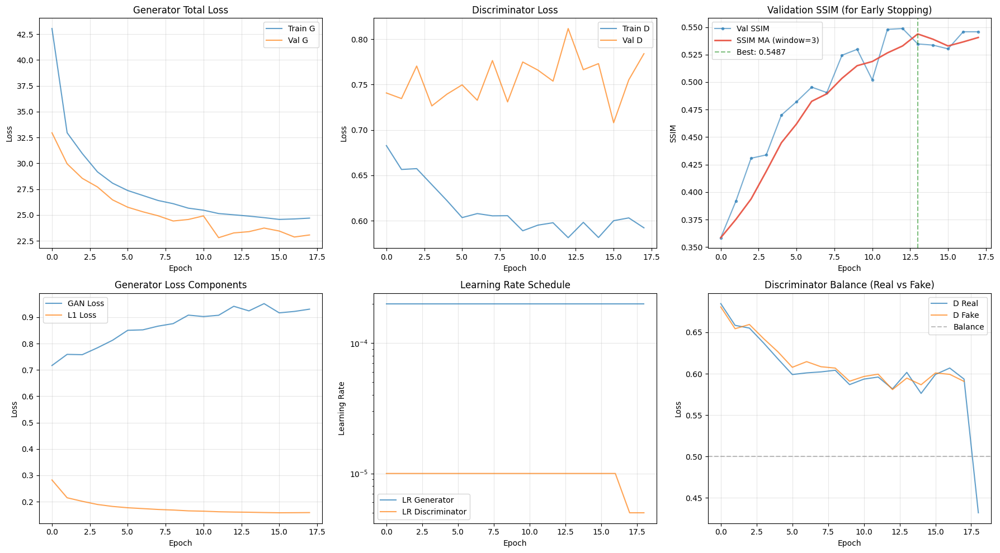


✅ Training curves saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\training_curves.png
  Train - Mean: nan | Std: nan | Max: nan | Mean(|·|): nan
  Val   - Mean: nan | Std: nan | Max: nan | Mean(|·|): nan
  Expected - Mean: ~0.0 | Std: ~0.3922 | Max: <1.0 | Mean(|·|): ~0.3129
  Expected - Mean: ~0.0 | Std: ~0.3922 | Max: <1.0
  Val   - Mean: nan | Std: nan | Max: nan


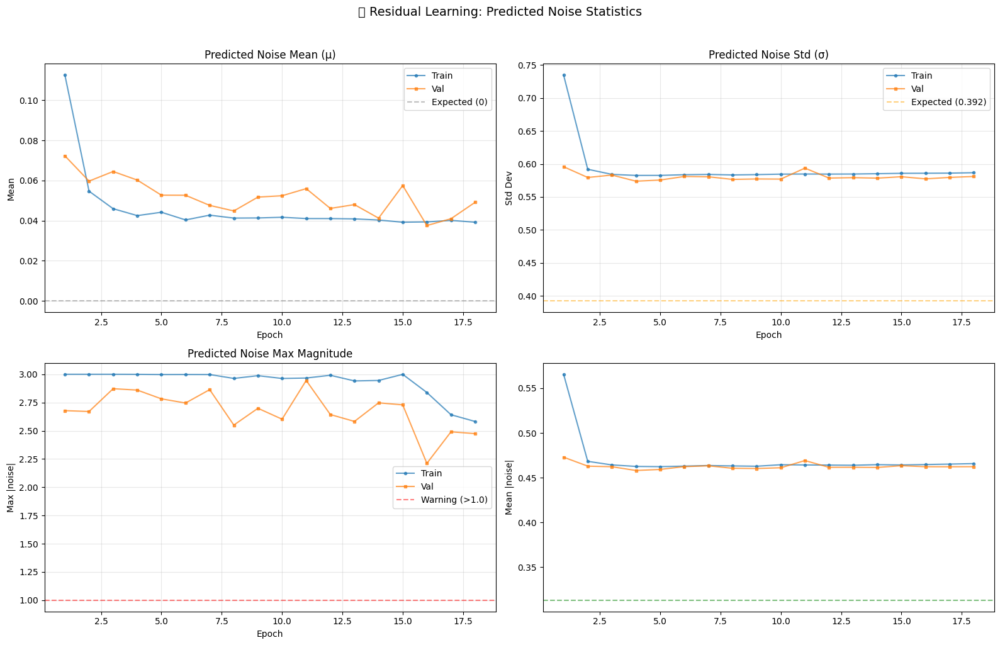

✅ Noise statistics plot saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\noise_statistics.png
  Train - Mean: nan | Std: nan | Max: nan

📊 Final Noise Statistics:


In [ ]:
# Plot training curves
if history:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    
    # Generator loss
    axes[0, 0].plot(history['train_loss_G'], label='Train G', alpha=0.7)
    axes[0, 0].plot(history['val_loss_G'], label='Val G', alpha=0.7)
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].set_title('Generator Total Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Discriminator loss
    axes[0, 1].plot(history['train_loss_D'], label='Train D', alpha=0.7)
    axes[0, 1].plot(history['val_loss_D'], label='Val D', alpha=0.7)
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].set_title('Discriminator Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # 🆕 SSIM + Moving Average
    if 'val_ssim' in history and len(history['val_ssim']) > 0:
        axes[0, 2].plot(history['val_ssim'], 'o-', label='Val SSIM', alpha=0.6, markersize=3)
        if 'val_ssim_ma' in history and len(history['val_ssim_ma']) > 0:
            axes[0, 2].plot(history['val_ssim_ma'], '-', label='SSIM MA (window=3)', 
                          linewidth=2, alpha=0.9, color='#e74c3c')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].set_ylabel('SSIM')
        axes[0, 2].set_title('Validation SSIM (for Early Stopping)')
        axes[0, 2].legend()
        axes[0, 2].grid(True, alpha=0.3)
        
        # Highlight best epoch
        if len(history['val_ssim']) > 0:
            best_ssim = max([x for x in history['val_ssim'] if x > 0], default=0)
            if best_ssim > 0:
                best_idx = [i for i, x in enumerate(history['val_ssim']) if x == best_ssim][0]
                axes[0, 2].axvline(best_idx + 1, color='green', linestyle='--', 
                                  alpha=0.5, label=f'Best: {best_ssim:.4f}')
                axes[0, 2].legend()
    
    # Generator components
    axes[1, 0].plot(history['train_loss_G_GAN'], label='GAN Loss', alpha=0.7)
    axes[1, 0].plot(history['train_loss_G_L1'], label='L1 Loss', alpha=0.7)
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].set_title('Generator Loss Components')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # Learning rates
    axes[1, 1].plot(history['lr_G'], label='LR Generator', alpha=0.7)
    axes[1, 1].plot(history['lr_D'], label='LR Discriminator', alpha=0.7)
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Learning Rate')
    axes[1, 1].set_title('Learning Rate Schedule')
    axes[1, 1].set_yscale('log')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
    
    # 🆕 Discriminator real vs fake
    if 'train_loss_D_real' in history and 'train_loss_D_fake' in history:
        axes[1, 2].plot(history['train_loss_D_real'], label='D Real', alpha=0.7)
        axes[1, 2].plot(history['train_loss_D_fake'], label='D Fake', alpha=0.7)
        axes[1, 2].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Balance')
        axes[1, 2].set_xlabel('Epoch')
        axes[1, 2].set_ylabel('Loss')
        axes[1, 2].set_title('Discriminator Balance (Real vs Fake)')
        axes[1, 2].legend()
        axes[1, 2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(exp_dir / 'training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"\n✅ Training curves saved to {exp_dir / 'training_curves.png'}")
    
    # 🆕 Plot noise_hat statistics (solo se residual_learning è attivo)
    if config.get('residual_learning', False) and 'train_noise_mean' in history and len(history['train_noise_mean']) > 0:
        fig, axes = plt.subplots(2, 2, figsize=(16, 10))
        
        epochs = list(range(1, len(history['train_noise_mean']) + 1))
        
        # Noise Mean (top-left)
        axes[0, 0].plot(epochs, history['train_noise_mean'], 'o-', label='Train', alpha=0.7, markersize=3)
        if 'val_noise_mean' in history and len(history['val_noise_mean']) > 0:
            axes[0, 0].plot(epochs, history['val_noise_mean'], 's-', label='Val', alpha=0.7, markersize=3)
        axes[0, 0].axhline(y=0, color='gray', linestyle='--', alpha=0.5, label='Expected (0)')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Mean')
        axes[0, 0].set_title('Predicted Noise Mean (μ)')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        
        # Noise Std (top-right)
        axes[0, 1].plot(epochs, history['train_noise_std'], 'o-', label='Train', alpha=0.7, markersize=3)
        if 'val_noise_std' in history and len(history['val_noise_std']) > 0:
            axes[0, 1].plot(epochs, history['val_noise_std'], 's-', label='Val', alpha=0.7, markersize=3)
        # Expected std for Gaussian noise with sigma=100 in [-1,1] range
        expected_std = config.get('noise_sigma', 100) / 255.0  # Normalize to [0,1] then scale to [-1,1]
        axes[0, 1].axhline(y=expected_std, color='orange', linestyle='--', alpha=0.5, 
                       label=f'Expected ({expected_std:.3f})')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Std Dev')
        axes[0, 1].set_title('Predicted Noise Std (σ)')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        # Noise Max (bottom-left)
        axes[1, 0].plot(epochs, history['train_noise_max'], 'o-', label='Train', alpha=0.7, markersize=3)
        if 'val_noise_max' in history and len(history['val_noise_max']) > 0:
            axes[1, 0].plot(epochs, history['val_noise_max'], 's-', label='Val', alpha=0.7, markersize=3)
        axes[1, 0].axhline(y=1.0, color='red', linestyle='--', alpha=0.5, label='Warning (>1.0)')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Max |noise|')
        axes[1, 0].set_title('Predicted Noise Max Magnitude')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)
        
        # 🆕 Noise Abs Mean (bottom-right)
        if 'train_noise_abs_mean' in history and len(history['train_noise_abs_mean']) > 0:
            axes[1, 1].plot(epochs, history['train_noise_abs_mean'], 'o-', label='Train', alpha=0.7, markersize=3)
            if 'val_noise_abs_mean' in history and len(history['val_noise_abs_mean']) > 0:
                axes[1, 1].plot(epochs, history['val_noise_abs_mean'], 's-', label='Val', alpha=0.7, markersize=3)
            # Expected mean(|noise|) for Gaussian noise ~ 0.798 * sigma
            expected_abs_mean = 0.798 * expected_std
            axes[1, 1].axhline(y=expected_abs_mean, color='green', linestyle='--', alpha=0.5, 
                           label=f'Expected ({expected_abs_mean:.3f})')
            print("=" * 70)
            axes[1, 1].set_ylabel('Mean |noise|')
            train_abs_mean = history.get('train_noise_abs_mean', [0])[-1] if history.get('train_noise_abs_mean') else 0
            print(f"  Train - Mean: {history['train_noise_mean'][-1]:.4f} | Std: {history['train_noise_std'][-1]:.4f} | Max: {history['train_noise_max'][-1]:.4f} | Mean(|·|): {train_abs_mean:.4f}")
        if 'val_noise_mean' in history and len(history['val_noise_mean']) > 0:
            last_val_idx = len([x for x in history['val_noise_mean'] if x != 0]) - 1
            if last_val_idx >= 0:
                val_abs_mean = history.get('val_noise_abs_mean', [0])[last_val_idx] if history.get('val_noise_abs_mean') and len(history.get('val_noise_abs_mean', [])) > last_val_idx else 0
                print(f"  Val   - Mean: {history['val_noise_mean'][last_val_idx]:.4f} | Std: {history['val_noise_std'][last_val_idx]:.4f} | Max: {history['val_noise_max'][last_val_idx]:.4f} | Mean(|·|): {val_abs_mean:.4f}")

        expected_abs_mean = 0.798 * expected_std
        plt.suptitle('🔍 Residual Learning: Predicted Noise Statistics', fontsize=14, y=1.02)        
        print("=" * 60)

        print(f"  Expected - Mean: ~0.0 | Std: ~{expected_std:.4f} | Max: <1.0 | Mean(|·|): ~{expected_abs_mean:.4f}")
        plt.tight_layout()        
        print(f"  Expected - Mean: ~0.0 | Std: ~{expected_std:.4f} | Max: <1.0")

        print("=" * 70)
        plt.savefig(exp_dir / 'noise_statistics.png', dpi=150, bbox_inches='tight')                
        print(f"  Val   - Mean: {history['val_noise_mean'][last_val_idx]:.4f} | Std: {history['val_noise_std'][last_val_idx]:.4f} | Max: {history['val_noise_max'][last_val_idx]:.4f}")

        plt.show()

        if last_val_idx >= 0:

            last_val_idx = len([x for x in history['val_noise_mean'] 
                            
        if x != 0]) - 1
            print(f"✅ Noise statistics plot saved to {exp_dir / 'noise_statistics.png'}")        
            if 'val_noise_mean' in history and len(history['val_noise_mean']) > 0:
                print(f"  Train - Mean: {history['train_noise_mean'][-1]:.4f} | Std: {history['train_noise_std'][-1]:.4f} | Max: {history['train_noise_max'][-1]:.4f}")

        # Print final statistics        if len(history['train_noise_mean']) > 0:

        print("\n📊 Final Noise Statistics:")        
        print("=" * 60)

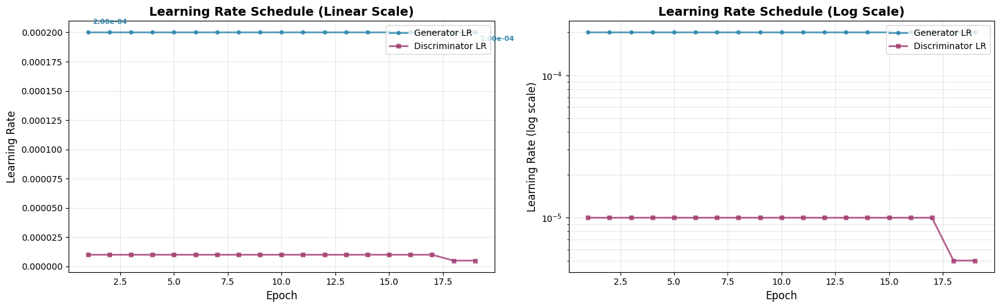


📊 Learning Rate Statistics:
Metric                    Generator       Discriminator  
------------------------------------------------------------
Initial LR                2.000000e-04    1.000000e-05
Final LR                  2.000000e-04    5.000000e-06
Max LR                    2.000000e-04    1.000000e-05
Min LR                    2.000000e-04    5.000000e-06
LR ratio (G:D)            40.0000

✅ Learning rate schedule saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\learning_rate_schedule.png


In [ ]:
# Detailed Learning Rate visualization
if history and 'lr_G' in history and len(history['lr_G']) > 0:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
    
    epochs = list(range(1, len(history['lr_G']) + 1))
    
    # Left plot: Linear scale (better for warmup visualization)
    ax1.plot(epochs, history['lr_G'], 'o-', label='Generator LR', alpha=0.8, markersize=4, linewidth=2, color='#2E86AB')
    ax1.plot(epochs, history['lr_D'], 's-', label='Discriminator LR', alpha=0.8, markersize=4, linewidth=2, color='#A23B72')
    
    # Highlight warmup phase
    if config.get('warmup_epochs', 0) > 0:
        warmup_end = min(config['warmup_epochs'], len(epochs))
        ax1.axvspan(0, warmup_end, alpha=0.2, color='yellow', label=f'Warmup ({warmup_end} epochs)')
        ax1.axvline(warmup_end, color='orange', linestyle='--', alpha=0.7, linewidth=2)
        ax1.text(warmup_end, ax1.get_ylim()[1] * 0.95, 'Warmup End', 
                ha='center', va='top', fontsize=10, fontweight='bold', color='orange')
    
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Learning Rate', fontsize=12)
    ax1.set_title('Learning Rate Schedule (Linear Scale)', fontsize=14, fontweight='bold')
    ax1.legend(loc='upper right', fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # Add value annotations at key points
    if len(epochs) > 0:
        # Initial LR
        ax1.annotate(f'{history["lr_G"][0]:.2e}', 
                    xy=(1, history['lr_G'][0]), 
                    xytext=(5, 10), textcoords='offset points',
                    fontsize=8, color='#2E86AB', fontweight='bold')
        # Final LR
        ax1.annotate(f'{history["lr_G"][-1]:.2e}', 
                    xy=(len(epochs), history['lr_G'][-1]), 
                    xytext=(5, -10), textcoords='offset points',
                    fontsize=8, color='#2E86AB', fontweight='bold')
    
    # Right plot: Log scale (better for decay visualization)
    ax2.plot(epochs, history['lr_G'], 'o-', label='Generator LR', alpha=0.8, markersize=4, linewidth=2, color='#2E86AB')
    ax2.plot(epochs, history['lr_D'], 's-', label='Discriminator LR', alpha=0.8, markersize=4, linewidth=2, color='#A23B72')
    
    # Highlight warmup phase
    if config.get('warmup_epochs', 0) > 0:
        warmup_end = min(config['warmup_epochs'], len(epochs))
        ax2.axvspan(0, warmup_end, alpha=0.2, color='yellow')
        ax2.axvline(warmup_end, color='orange', linestyle='--', alpha=0.7, linewidth=2)
    
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Learning Rate (log scale)', fontsize=12)
    ax2.set_title('Learning Rate Schedule (Log Scale)', fontsize=14, fontweight='bold')
    ax2.set_yscale('log')
    ax2.legend(loc='upper right', fontsize=10)
    ax2.grid(True, alpha=0.3, which='both')
    
    plt.tight_layout()
    plt.savefig(exp_dir / 'learning_rate_schedule.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Print LR statistics
    print("\n📊 Learning Rate Statistics:")
    print("=" * 60)
    print(f"{'Metric':<25} {'Generator':<15} {'Discriminator':<15}")
    print("-" * 60)
    print(f"{'Initial LR':<25} {history['lr_G'][0]:.6e}    {history['lr_D'][0]:.6e}")
    print(f"{'Final LR':<25} {history['lr_G'][-1]:.6e}    {history['lr_D'][-1]:.6e}")
    print(f"{'Max LR':<25} {max(history['lr_G']):.6e}    {max(history['lr_D']):.6e}")
    print(f"{'Min LR':<25} {min(history['lr_G']):.6e}    {min(history['lr_D']):.6e}")
    
    if config.get('warmup_epochs', 0) > 0:
        warmup_end_idx = min(config['warmup_epochs'] - 1, len(history['lr_G']) - 1)
        print(f"{'LR after warmup':<25} {history['lr_G'][warmup_end_idx]:.6e}    {history['lr_D'][warmup_end_idx]:.6e}")
    
    print(f"{'LR ratio (G:D)':<25} {history['lr_G'][-1] / history['lr_D'][-1]:.4f}")
    print("=" * 60)
    
    print(f"\n✅ Learning rate schedule saved to {exp_dir / 'learning_rate_schedule.png'}")
else:
    print("⚠️ No learning rate history available to plot")

## 12b. Learning Rate Schedule Visualization

## 13. Test Inference on Validation Samples

✅ Loaded best model from epoch 13
   Val Loss G: 23.2619


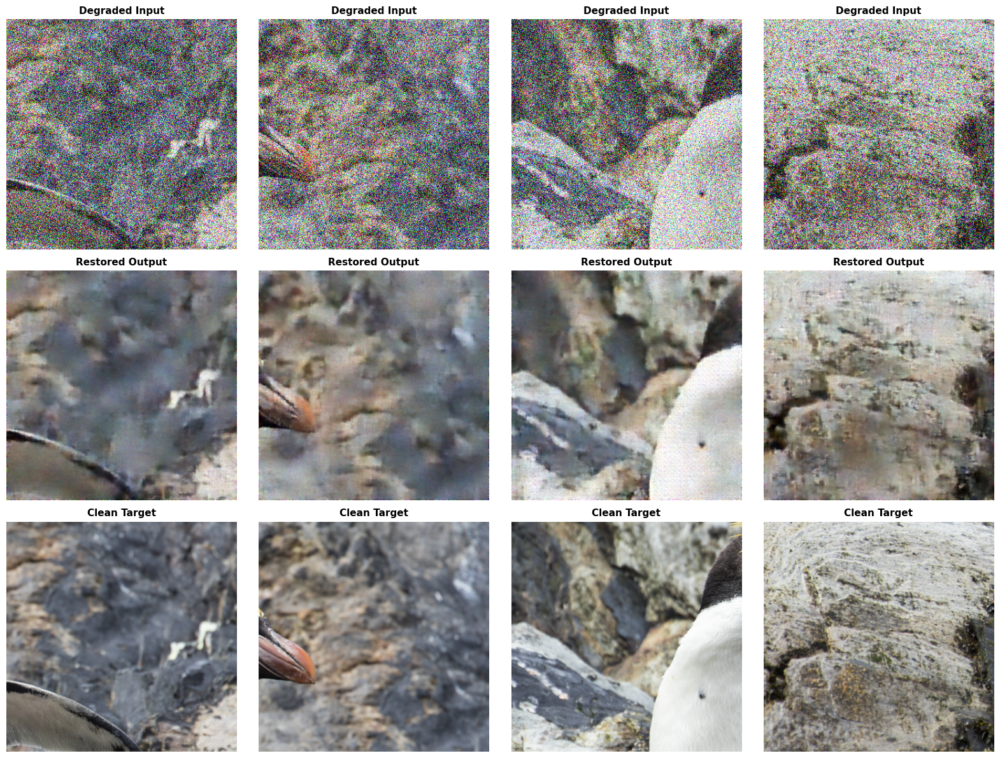


✅ Inference results saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\samples\inference_results.png


In [ ]:
# Load best model
checkpoint = torch.load(checkpoints_dir / "best_model.pth", map_location=config['device'], weights_only=False)
generator.load_state_dict(checkpoint['generator_state_dict'])
discriminator.load_state_dict(checkpoint['discriminator_state_dict'])

print(f"✅ Loaded best model from epoch {checkpoint['epoch']}")

# Handle both old and new checkpoint formats
if "metrics" in checkpoint:
    val_loss_g = checkpoint["metrics"].get("val", {}).get("loss_G", "N/A")
elif "val_loss_G" in checkpoint:
    val_loss_g = checkpoint["val_loss_G"]
else:
    val_loss_g = "N/A"

if val_loss_g != "N/A":
    print(f"   Val Loss G: {val_loss_g:.4f}")
else:
    print(f"   Val Loss G: N/A")

# Get validation batch
degraded_batch, clean_batch = next(iter(val_loader))
degraded_batch = degraded_batch.to(config["device"])
clean_batch = clean_batch.to(config["device"])

# Inference
generator.eval()
with torch.no_grad():
    # 🆕 Gestisci residual learning
    if config['residual_learning']:
        noise_hat = generator(degraded_batch)
        restored_batch = torch.clamp(degraded_batch - noise_hat, -1, 1)
    else:
        restored_batch = generator(degraded_batch)

# Visualize results
plot_inference_results(
    degraded_batch=degraded_batch,
    restored_batch=restored_batch,
    clean_batch=clean_batch,
    n_samples=4,
    save_path=samples_dir / "inference_results.png",
)

print(f"\n✅ Inference results saved to {samples_dir / 'inference_results.png'}")

## 14. Quantitative Evaluation on Full-Resolution Images

Evaluate the generator on entire validation images using sliding window inference.

In [ ]:
# Create evaluator (use generator only)
evaluator = ImageRestorationEvaluator(
    model=generator,
    device=config["device"],
    patch_size=config["patch_size"],
    overlap=64,  # Larger overlap for smoother blending
    residual_learning=config["residual_learning"],  # 🆕 Passa il parametro
)

print("\n🔍 Evaluator configured:")
print(f"   Model: Pix2Pix Generator")
if config["residual_learning"]:
    print(f"   🆕 Mode: Residual Learning (predicts noise)")
else:
    print(f"   Mode: Direct Prediction (predicts clean image)")
print(f"   Patch size: {config['patch_size']}")
print("   Overlap: 64 pixels")
print(f"   Device: {config['device']}")


🔍 Evaluator configured:
   Model: Pix2Pix Generator
   🆕 Mode: Residual Learning (predicts noise)
   Patch size: 384
   Overlap: 64 pixels
   Device: cuda


In [ ]:
# Evaluate on validation set (limit to 10 images for speed)
eval_results = evaluator.evaluate_dataset(
    degraded_dir=config["val_degraded_dir"],
    clean_dir=config["val_clean_dir"],
    output_dir=exp_dir / "restored_images",
    save_outputs=True,
    max_images=10,
)

# Print summary
evaluator.print_summary(eval_results)

# Save results
evaluator.save_results(eval_results, exp_dir / "evaluation_metrics.json")

print(f"\n✅ Evaluation metrics saved to {exp_dir / 'evaluation_metrics.json'}")


📊 Evaluating 10 images...


Processing images:   0%|          | 0/10 [00:00<?, ?it/s]


EVALUATION SUMMARY

📊 Evaluated 10 images

📈 Mean Metrics:
   PSNR: 24.12 ± 1.81 dB
   SSIM: 0.5863 ± 0.0425
   MAE: 0.045213 ± 0.011265
   MSE: 0.004321 ± 0.002560

🏆 Best Image (highest PSNR):
   0803.png
   PSNR: 26.44 dB, SSIM: 0.6287

⚠️  Worst Image (lowest PSNR):
   0807.png
   PSNR: 19.30 dB, SSIM: 0.4840


✅ Results saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\evaluation_metrics.json

✅ Evaluation metrics saved to c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\evaluation_metrics.json


## 15. Visualize Full-Resolution Restoration


🏆 Best result: 0803.png
   PSNR: 26.44 dB, SSIM: 0.6287


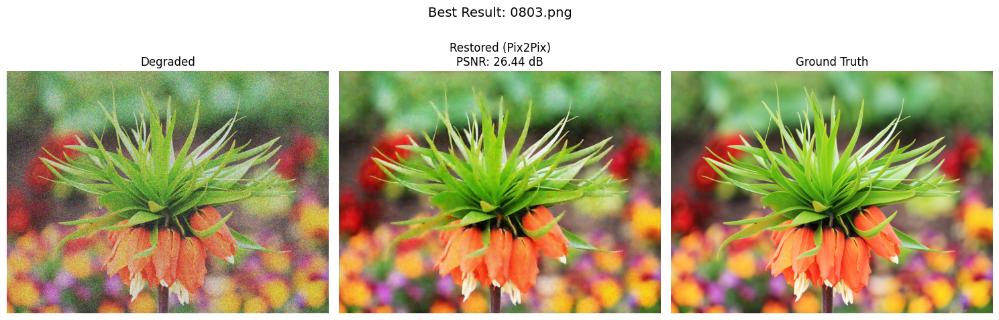


⚠️ Worst result: 0807.png
   PSNR: 19.30 dB, SSIM: 0.4840


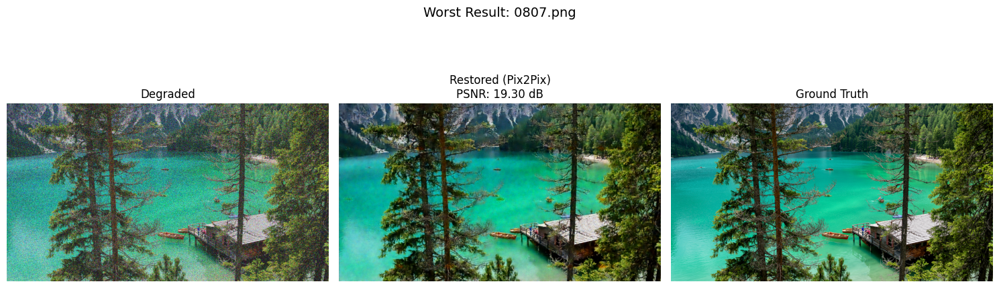

In [ ]:
# Get best and worst images
if eval_results['per_image']:
    best_img = max(eval_results["per_image"], key=lambda x: x["psnr"])
    worst_img = min(eval_results["per_image"], key=lambda x: x["psnr"])

    def load_image_trio(filename):
        degraded_path = Path(config["val_degraded_dir"]) / filename
        clean_path = Path(config["val_clean_dir"]) / filename
        restored_path = exp_dir / "restored_images" / filename

        degraded = cv2.cvtColor(cv2.imread(str(degraded_path)), cv2.COLOR_BGR2RGB)
        clean = cv2.cvtColor(cv2.imread(str(clean_path)), cv2.COLOR_BGR2RGB)
        restored = cv2.cvtColor(cv2.imread(str(restored_path)), cv2.COLOR_BGR2RGB)

        return degraded, restored, clean

    # Visualize best result
    print(f"\n🏆 Best result: {best_img['filename']}")
    print(f"   PSNR: {best_img['psnr']:.2f} dB, SSIM: {best_img['ssim']:.4f}")

    deg, res, cln = load_image_trio(best_img["filename"])

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(deg)
    axes[0].set_title("Degraded")
    axes[0].axis("off")
    axes[1].imshow(res)
    axes[1].set_title(f"Restored (Pix2Pix)\nPSNR: {best_img['psnr']:.2f} dB")
    axes[1].axis("off")
    axes[2].imshow(cln)
    axes[2].set_title("Ground Truth")
    axes[2].axis("off")

    plt.suptitle(f"Best Result: {best_img['filename']}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig(samples_dir / "best_full_restoration.png", dpi=150, bbox_inches="tight")
    plt.show()

    # Visualize worst result
    print(f"\n⚠️ Worst result: {worst_img['filename']}")
    print(f"   PSNR: {worst_img['psnr']:.2f} dB, SSIM: {worst_img['ssim']:.4f}")

    deg, res, cln = load_image_trio(worst_img["filename"])

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(deg)
    axes[0].set_title("Degraded")
    axes[0].axis("off")
    axes[1].imshow(res)
    axes[1].set_title(f"Restored (Pix2Pix)\nPSNR: {worst_img['psnr']:.2f} dB")
    axes[1].axis("off")
    axes[2].imshow(cln)
    axes[2].set_title("Ground Truth")
    axes[2].axis("off")

    plt.suptitle(f"Worst Result: {worst_img['filename']}", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig(samples_dir / "worst_full_restoration.png", dpi=150, bbox_inches="tight")
    plt.show()

## 16. Summary

**Pix2Pix GAN Training Complete!**

**Key Differences from UNet:**
- **Architecture:** Generator is UNet-based, but trained adversarially with PatchGAN discriminator
- **Loss:** Combines adversarial loss (fool discriminator) + L1 loss (pixel accuracy)
- **Training:** Alternating optimization of G and D
- **Output Quality:** Should produce sharper, more realistic details compared to pure L1/L2 training

**Expected Results:**
- Better visual quality (sharper edges, more realistic textures)
- Slightly lower PSNR/SSIM (adversarial training optimizes perceptual quality, not pixel-wise metrics)
- More stable than other GAN variants (thanks to PatchGAN + L1 loss)

**Next Steps:**
1. Compare Pix2Pix results with UNet baseline
2. Try different lambda_L1 weights (50, 100, 200)
3. Test on other degradations (dithering, blur, compression)
4. Consider ESRGAN for even better perceptual quality

In [ ]:
# Print final summary
print("\n" + "=" * 80)
print("📊 PIX2PIX GAN TRAINING SUMMARY")
print("=" * 80)
print(f"\n🤖 Model:")
print(f"   Generator: {generator.get_num_params():,} parameters")
print(f"   Discriminator: {discriminator.get_num_params():,} parameters")
print(f"   Total: {generator.get_num_params() + discriminator.get_num_params():,} parameters")

if history:
    print(f"\n📈 Training:")
    print(f"   Total epochs: {len(history['train_loss_G'])}")
    print(f"   Best epoch: {best_epoch}")
    print(f"   Best val loss G: {best_val_loss_G:.4f}")
    print(f"   Final train loss G: {history['train_loss_G'][-1]:.4f}")
    print(f"   Final train loss D: {history['train_loss_D'][-1]:.4f}")

if eval_results and eval_results.get('per_image'):
    print(f"\n🎯 Evaluation (Full-Resolution):")
    print(f"   Images evaluated: {len(eval_results['per_image'])}")
    
    # Check for different possible key formats
    if 'avg_psnr' in eval_results:
        print(f"   Avg PSNR: {eval_results['avg_psnr']:.2f} dB")
        print(f"   Avg SSIM: {eval_results['avg_ssim']:.4f}")
        print(f"   Avg MAE: {eval_results['avg_mae']:.4f}")
    elif 'average' in eval_results:
        print(f"   Avg PSNR: {eval_results['average']['psnr']:.2f} dB")
        print(f"   Avg SSIM: {eval_results['average']['ssim']:.4f}")
        print(f"   Avg MAE: {eval_results['average']['mae']:.4f}")
    else:
        # Calculate manually from per_image results
        avg_psnr = sum(img['psnr'] for img in eval_results['per_image']) / len(eval_results['per_image'])
        avg_ssim = sum(img['ssim'] for img in eval_results['per_image']) / len(eval_results['per_image'])
        avg_mae = sum(img['mae'] for img in eval_results['per_image']) / len(eval_results['per_image'])
        print(f"   Avg PSNR: {avg_psnr:.2f} dB")
        print(f"   Avg SSIM: {avg_ssim:.4f}")
        print(f"   Avg MAE: {avg_mae:.4f}")

print(f"\n📁 Outputs:")
print(f"   Experiment dir: {exp_dir}")
print(f"   Best model: {checkpoints_dir / 'best_model.pth'}")
print(f"   Training curves: {exp_dir / 'training_curves.png'}")
print(f"   Evaluation: {exp_dir / 'evaluation_metrics.json'}")

print("\n" + "=" * 80)
print("✅ ALL DONE!")
print("=" * 80 + "\n")


📊 PIX2PIX GAN TRAINING SUMMARY

🤖 Model:
   Generator: 167,281,923 parameters
   Discriminator: 696,193 parameters
   Total: 167,978,116 parameters

📈 Training:
   Total epochs: 19
   Best epoch: 13
   Best val loss G: 23.2619
   Final train loss G: nan
   Final train loss D: nan

🎯 Evaluation (Full-Resolution):
   Images evaluated: 10
   Avg PSNR: 24.12 dB
   Avg SSIM: 0.5863
   Avg MAE: 0.0452

📁 Outputs:
   Experiment dir: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939
   Best model: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\checkpoints\best_model.pth
   Training curves: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\training_curves.png
   Evaluation: c:\Development\Deep_Learning\Progetto1\Image-Enhancement\experiments\pix2pix\gaussian\20260109_211939\evaluation_metrics.json

✅ ALL DONE!

